### Libraries and Imports 

In [1]:
# Import the necessary library
import os
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import precision_recall_curve, average_precision_score

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split
from torchvision.models import resnet18

## Image Copying and Counting Function 

In [16]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Define the original directories and their corresponding class names
original_base = r"C:\Users\HP\Downloads\dataset 2d"

original_dirs = {
    'Calculus': os.path.join(original_base, 'Calculus'),
    'Caries': os.path.join(original_base, 'Caries'),
    'Gingivitis': os.path.join(original_base, 'Gingivitis'),
    'Ulcers': os.path.join(original_base, 'Ulcers'),
    'Tooth Discoloration': os.path.join(original_base, 'Tooth Discoloration'),
    'Hypodontia': os.path.join(original_base, 'Hypodontia'),
}

# Define the target base directory
base_dir = r"C:\Users\HP\Downloads\organized_dataset"

# Define the target structure
splits = ['train', 'val', 'test']
classes = list(original_dirs.keys())

# Create target directories
for split in splits:
    for class_name in classes:
        os.makedirs(os.path.join(base_dir, split, class_name), exist_ok=True)

# Initialize dictionaries to hold the counts for train, val, and test sets
class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in classes}

# Function to copy images to the target directory and count them
def copy_and_count_images(class_name, image_paths):
    # Split the data
    train_paths, test_paths = train_test_split(image_paths, test_size=0.1, random_state=42)
    train_paths, val_paths = train_test_split(train_paths, test_size=0.2, random_state=42)  # 0.2 * 0.9 = 0.18

    # Define split mappings
    split_paths = {
        'train': train_paths,
        'val': val_paths,
        'test': test_paths
    }

    # Copy images to their respective directories and count them
    for split, paths in split_paths.items():
        class_split_counts[class_name][split] = len(paths)
        for img_path in paths:
            target_path = os.path.join(base_dir, split, class_name, os.path.basename(img_path))
            shutil.copy(img_path, target_path)

# Traverse the original directories and gather image paths
for class_name, original_dir in original_dirs.items():
    image_paths = []
    for root, dirs, files in os.walk(original_dir):
        image_paths.extend([os.path.join(root, file) for file in files if file.lower().endswith(('.jpg', '.jpeg', '.png'))])
    if image_paths:
        copy_and_count_images(class_name, image_paths)

print("Images have been copied and organized successfully.")


Images have been copied and organized successfully.


## Displaying Random Images 

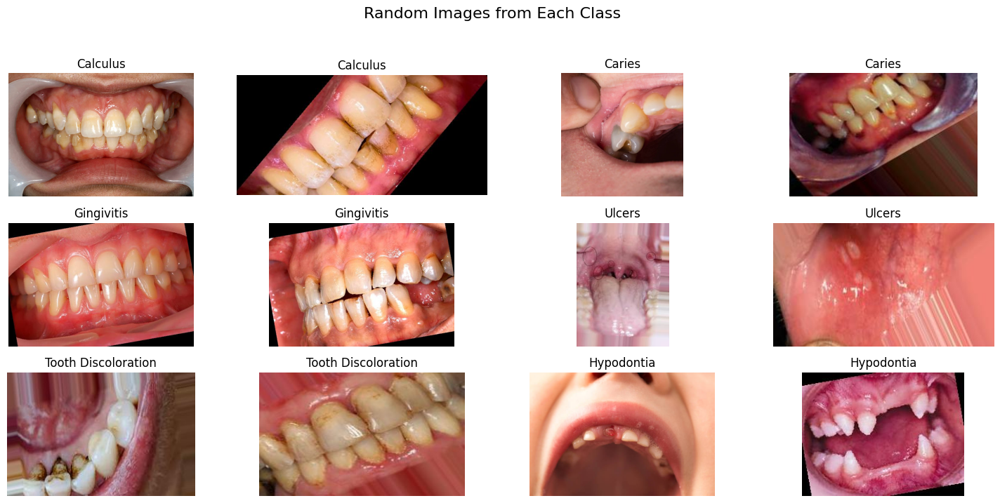

In [17]:
# Number of images to display per class and per row
num_images_per_class = 2
num_images_per_row = 4

# Set seed for reproducibility
random.seed(42)

# Function to get random images from a directory
def get_random_images_from_dir(directory, num_images):
    all_images = [os.path.join(directory, img) for img in os.listdir(directory) if img.endswith(('.jpg', '.jpeg', '.png'))]
    if len(all_images) < num_images:
        return all_images
    return random.sample(all_images, num_images)

# Create a figure
num_rows = (len(classes) * num_images_per_class + num_images_per_row - 1) // num_images_per_row  # Calculate number of rows needed
fig, axs = plt.subplots(num_rows, num_images_per_row, figsize=(15, num_rows * 2.5))
fig.suptitle('Random Images from Each Class', fontsize=16)

# Flatten axs array for easier indexing
axs = axs.flatten()

# Iterate through classes and display images
image_idx = 0
for class_name in classes:
    class_dir = os.path.join(base_dir, 'train', class_name)
    random_images = get_random_images_from_dir(class_dir, num_images_per_class)
    
    for img_path in random_images:
        if image_idx < len(axs):
            img = Image.open(img_path)
            ax = axs[image_idx]
            ax.imshow(img)
            ax.set_title(class_name)
            ax.axis('off')
            image_idx += 1

# Hide any unused subplots
for i in range(image_idx, len(axs)):
    axs[i].axis('off')

# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## Data Visualization - Bar Plot 📊

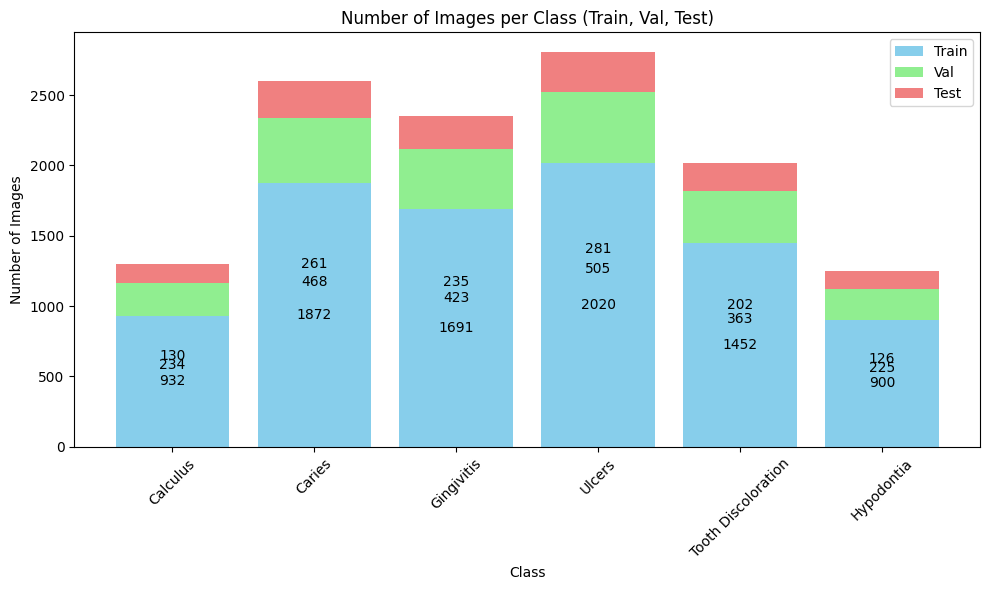

In [18]:
# Initialize dictionaries to hold the counts for train, val, and test sets
class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in classes}

# Function to count images in each split
def count_images(base_dir, class_name):
    counts = {}
    for split in ['train', 'val', 'test']:
        split_dir = os.path.join(base_dir, split, class_name)
        counts[split] = len(os.listdir(split_dir))
    return counts

# Calculate counts for each class and split
for class_name in classes:
    class_split_counts[class_name] = count_images(base_dir, class_name)

# Create lists for the bar plot
labels = classes
train_counts = [class_split_counts[class_name]['train'] for class_name in classes]
val_counts = [class_split_counts[class_name]['val'] for class_name in classes]
test_counts = [class_split_counts[class_name]['test'] for class_name in classes]

x = range(len(classes))

# Create the stacked bar plot
fig, ax = plt.subplots(figsize=(10, 6))

bar1 = ax.bar(x, train_counts, label='Train', color='skyblue')
bar2 = ax.bar(x, val_counts, bottom=train_counts, label='Val', color='lightgreen')
bar3 = ax.bar(x, test_counts, bottom=[i+j for i,j in zip(train_counts, val_counts)], label='Test', color='lightcoral')

ax.set_xlabel('Class')
ax.set_ylabel('Number of Images')
ax.set_title('Number of Images per Class (Train, Val, Test)')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend()

# Add data labels
for bar in bar1:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval / 2, int(yval), ha='center', va='center', color='black')

for bar in bar2:
    yval = bar.get_height() + bar.get_y()
    ax.text(bar.get_x() + bar.get_width()/2, yval / 2, int(bar.get_height()), ha='center', va='center', color='black')

for bar in bar3:
    yval = bar.get_height() + bar.get_y()
    ax.text(bar.get_x() + bar.get_width()/2, yval / 2, int(bar.get_height()), ha='center', va='center', color='black')

plt.tight_layout()
plt.show()


## Model Preparing and Training

In [20]:
# Define directories
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Parameters
image_size = (128, 128)
batch_size = 16
num_epochs = 10

# Data augmentation and normalization for training
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(image_size, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Normalization for validation and testing
val_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Load datasets
train_dataset = ImageFolder(train_dir, transform=train_transforms)
val_dataset = ImageFolder(val_dir, transform=val_transforms)
test_dataset = ImageFolder(test_dir, transform=val_transforms)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

In [21]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import densenet121

# Get number of classes
num_classes = len(train_dataset.classes)

# Use a smaller model - DenseNet121
class CustomDenseNet(nn.Module):
    def __init__(self):
        super(CustomDenseNet, self).__init__()
        self.model = densenet121(weights=True)  # Load pre-trained DenseNet121
        self.model.classifier = nn.Linear(self.model.classifier.in_features, num_classes)

    def forward(self, x):
        return self.model(x)

# Initialize the model, loss function, and optimizer
model = CustomDenseNet()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


c:\Users\HP\AppData\Local\Programs\Python\Python38\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to C:\Users\HP/.cache\torch\hub\checkpoints\densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:05<00:00, 5.95MB/s]


In [22]:
# Set environment variable to avoid threading issues
os.environ["OMP_NUM_THREADS"] = "1"

# Define the scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=2, verbose=True)

# Early stopping parameters
early_stopping = True
patience = 3  # Number of epochs to wait if no improvement is observed

# Initialize early stopping variables
best_val_loss = float('inf')
epochs_no_improve = 0
early_stop = False

# Initialize lists to store losses, accuracies, and learning rates
train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

# Variables to store y_true and y_scores for precision-recall calculation
y_true = []
y_scores = []

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for i, (inputs, labels) in enumerate(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * inputs.size(0)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    epoch_loss = running_loss / len(train_dataset)
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_acc)

    # Validation
    model.eval()
    val_loss = 0.0
    val_preds = []
    val_true = []
    val_outputs = []
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            val_preds.extend(predicted.cpu().numpy())
            val_true.extend(labels.cpu().numpy())
            val_outputs.extend(outputs.cpu().numpy())

    val_loss = val_loss / len(val_dataset)
    val_acc = accuracy_score(val_true, val_preds)
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    # Append true labels and predicted scores for precision-recall calculation
    y_true.extend(val_true)
    y_scores.extend(val_outputs)

    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {epoch_loss:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}')

    # Check for improvement in validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_no_improve = 0
        # Save the model checkpoint here if you want

    else:
        epochs_no_improve += 1
        if epochs_no_improve >= patience:
            print(f'Early stopping after {epoch+1} epochs.')
            early_stop = True
            break

    # LR scheduler step based on validation loss
    scheduler.step(val_loss)

    if early_stop:
        break

c:\Users\HP\AppData\Local\Programs\Python\Python38\lib\site-packages\torch\optim\lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/10], Train Loss: 0.8745, Val Loss: 0.5998, Val Acc: 0.7674
Epoch [2/10], Train Loss: 0.6078, Val Loss: 0.5390, Val Acc: 0.7840
Epoch [3/10], Train Loss: 0.4949, Val Loss: 0.4051, Val Acc: 0.8458
Epoch [4/10], Train Loss: 0.4172, Val Loss: 0.4826, Val Acc: 0.8120
Epoch [5/10], Train Loss: 0.3929, Val Loss: 0.3318, Val Acc: 0.8625
Epoch [6/10], Train Loss: 0.3612, Val Loss: 0.3559, Val Acc: 0.8620
Epoch [7/10], Train Loss: 0.3356, Val Loss: 0.3395, Val Acc: 0.8747
Epoch [8/10], Train Loss: 0.3175, Val Loss: 0.3976, Val Acc: 0.8422
Early stopping after 8 epochs.


## Model Evaluation 

In [23]:
# Test the model
model.eval()
test_preds = []
test_true = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        test_preds.extend(predicted.cpu().numpy())
        test_true.extend(labels.cpu().numpy())

test_acc = accuracy_score(test_true, test_preds)
print(f'Test Accuracy: {test_acc:.4f}')

Test Accuracy: 0.8397


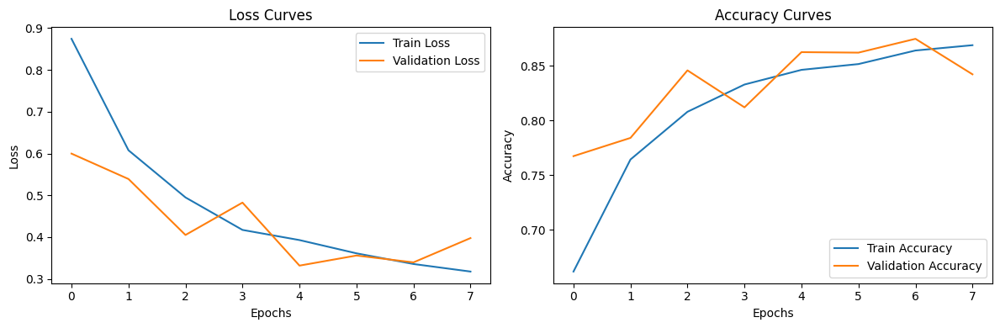

In [24]:
# Plotting loss and accuracy in subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# Plotting loss
ax1.plot(train_losses, label='Train Loss')
ax1.plot(val_losses, label='Validation Loss')
ax1.set_title('Loss Curves')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plotting accuracy
ax2.plot(train_accuracies, label='Train Accuracy')
ax2.plot(val_accuracies, label='Validation Accuracy')
ax2.set_title('Accuracy Curves')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

plt.tight_layout()
plt.show()

In [25]:
# Generate classification report
class_names = test_dataset.classes
report = classification_report(test_true, test_preds, target_names=class_names)

# Display classification report
print("Classification Report:")
print(report)

Classification Report:
                     precision    recall  f1-score   support

           Calculus       0.72      0.53      0.61       130
             Caries       0.73      0.97      0.83       261
         Gingivitis       0.77      0.86      0.81       235
         Hypodontia       0.95      0.83      0.89       126
Tooth Discoloration       0.95      0.72      0.82       202
             Ulcers       0.98      0.93      0.96       281

           accuracy                           0.84      1235
          macro avg       0.85      0.81      0.82      1235
       weighted avg       0.85      0.84      0.84      1235



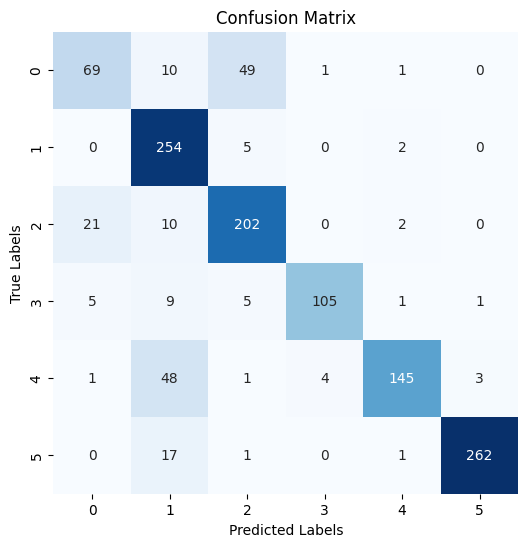

In [26]:
# Get predictions for the test set
model.eval()
y_true = []
y_pred = []
with torch.no_grad():
    for inputs, labels in test_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, predicted = torch.max(outputs.data, 1)
        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

# Calculate confusion matrix
conf_mat = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

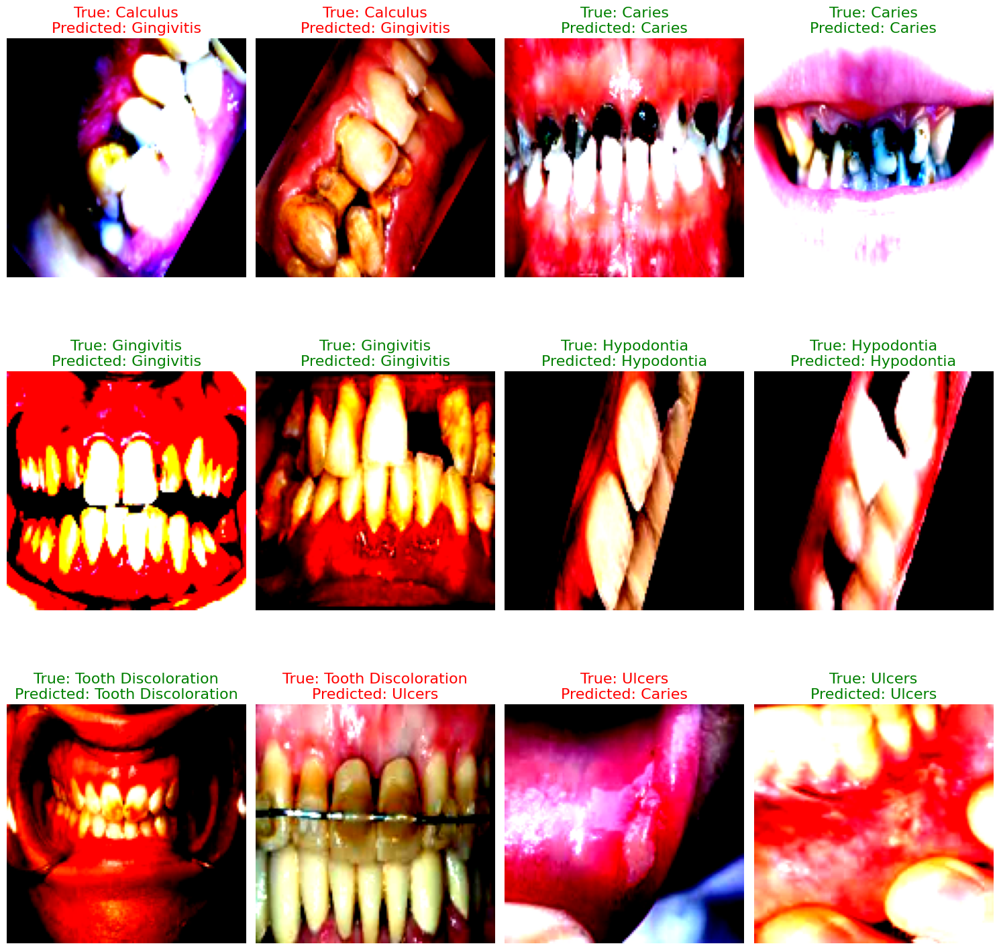

In [27]:
# Set seed for reproducibility
random.seed(42)

# Function to display random images with true and predicted classes
def display_random__predicted_images(model, test_loader, class_names, num_images_per_class=5):
    model.eval()
    plt.figure(figsize=(15, 30))
    images_so_far = 0
    class_counts = {classname: 0 for classname in class_names}
    shown_images = []

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(test_loader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size(0)):
                true_class_name = class_names[labels[j].item()]
                predicted_class_name = class_names[preds[j].item()]

                if class_counts[true_class_name] < num_images_per_class and (true_class_name, j) not in shown_images:
                    images_so_far += 1
                    ax = plt.subplot(len(class_names), num_images_per_class * 2, images_so_far)
                    ax.axis('off')
                    if true_class_name == predicted_class_name:
                        title_color = 'green'
                    else:
                        title_color = 'red'
                    ax.set_title(f'True: {true_class_name}\nPredicted: {predicted_class_name}', fontsize=16, color=title_color)
                    plt.imshow(inputs.cpu().data[j].permute(1, 2, 0))
                    class_counts[true_class_name] += 1
                    shown_images.append((true_class_name, j))

                if images_so_far >= len(class_names) * num_images_per_class:
                    return

# Display random predicted images
display_random__predicted_images(model, test_loader, class_names, num_images_per_class=2)
plt.tight_layout()
plt.show()

In [4]:
torch.save(model.state_dict(), "resnet_dental_model.pth")


In [6]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import os
import json

# ---------------------
# Load Class Labels
# ---------------------
class_names = ['Calculus', 'Caries', 'Gingivitis', 'Ulcers', 'Tooth Discoloration', 'Hypodontia']

# ---------------------
# Define Transforms
# ---------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet mean
                         std=[0.229, 0.224, 0.225])   # ImageNet std
])

# ---------------------
# Load Trained Model
# ---------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet18(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, len(class_names))  # Adjust last layer
model.load_state_dict(torch.load(r"C:\Users\HP\Downloads\working\resnet_dental_model.pth", map_location=device))  # ✅ Update with your path
model.to(device)
model.eval()

# ---------------------
# Inference Function
# ---------------------
def predict_image(image_path):
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        outputs = model(input_tensor)
        probs = torch.softmax(outputs, dim=1)
        conf, pred = torch.max(probs, 1)
    
    return {
        "image_name": os.path.basename(image_path),
        "prediction": class_names[pred.item()],
        "confidence": round(conf.item(), 4)
    }

# ---------------------
# Run on Directory
# ---------------------
input_dir = r"C:\Users\HP\Downloads\working\organized_dataset\test"  # ✅ Update this
results = []

for filename in os.listdir(input_dir):
    if filename.endswith((".png", ".jpg", ".jpeg")):
        img_path = os.path.join(input_dir, filename)
        try:
            result = predict_image(img_path)
            results.append(result)
        except Exception as e:
            print(f"Error processing {filename}: {e}")

# ---------------------
# Save to JSON
# ---------------------
with open("classification_results.json", "w") as f:
    json.dump(results, f, indent=4)

print("✅ Predictions saved to classification_results.json")


✅ Predictions saved to classification_results.json


C:\Users\HP\AppData\Local\Temp\ipykernel_16272\3462806729.py:30: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(r"C:\Users\HP\Downloads\worki

In [10]:
import os
import torch
from stl import mesh
import numpy as np
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image

# Load Class Labels
class_names = ['Calculus', 'Caries', 'Gingivitis', 'Ulcers', 'Tooth Discoloration', 'Hypodontia']

# Define Transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load Trained Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet18(pretrained=False)
model.fc = torch.nn.Linear(model.fc.in_features, len(class_names))  # Adjust last layer
model.load_state_dict(torch.load(r"C:\Users\HP\Downloads\working\resnet_dental_model.pth", map_location=device))
model.to(device)
model.eval()

# Function to predict image classification
def predict_image(image_path):
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)
    
    with torch.no_grad():
        outputs = model(input_tensor)
        probs = torch.softmax(outputs, dim=1)
        conf, pred = torch.max(probs, 1)
    
    return class_names[pred.item()], round(conf.item(), 4)

# Load STL model
def load_stl(file_path):
    return mesh.Mesh.from_file(file_path)

# Plot 3D model with color-coded regions
def plot_3d_model(stl_mesh, predictions=None):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Plot the STL model
    ax.plot_trisurf(stl_mesh.x.flatten(), stl_mesh.y.flatten(), stl_mesh.z.flatten(), color='gray', alpha=0.3)

    # If predictions are available, color the regions based on the predicted condition
    if predictions:
        for idx, condition in predictions.items():
            # Here you would map the specific regions or faces to conditions
            # In this example, we're coloring everything as a placeholder.
            color_map = {
                'Caries': 'red',
                'Calculus': 'yellow',
                'Gingivitis': 'blue',
                'Ulcers': 'purple',
                'Tooth Discoloration': 'orange',
                'Hypodontia': 'gray'
            }
            ax.plot_trisurf(stl_mesh.x.flatten(), stl_mesh.y.flatten(), stl_mesh.z.flatten(), color=color_map.get(condition, 'gray'))

    plt.show()

# Process Images and Apply Results to 3D Model
def process_and_map_images(input_dir, stl_file_path):
    results = []
    
    # Load STL file
    dental_model = load_stl(stl_file_path)
    
    # Process each image in the directory
    for filename in os.listdir(input_dir):
        if filename.endswith((".png", ".jpg", ".jpeg")):
            img_path = os.path.join(input_dir, filename)
            try:
                # Step 1: Predict image classification
                prediction, confidence = predict_image(img_path)
                
                # Step 2: Map the prediction to the model (you can customize this mapping logic)
                # For simplicity, we associate each image to a condition
                tooth_name = filename.split('.')[0]
                
                results.append({
                    "image_name": filename,
                    "prediction": prediction,
                    "confidence": confidence
                })
                
                # Step 3: Visualize the condition on the 3D model (map predictions to regions here)
                # Example: Use the predictions to color parts of the model based on condition
                plot_3d_model(dental_model, predictions={tooth_name: prediction})
                
            except Exception as e:
                print(f"Error processing {filename}: {e}")
    
    # Save results to JSON
    with open("classification_results.json", "w") as f:
        json.dump(results, f, indent=4)

    print("✅ Predictions saved to classification_results.json")

# Run the pipeline
input_dir = r"C:\Users\HP\Downloads\working\organized_dataset\test"  # Update with your actual path to images
stl_file_path =r"C:\Users\HP\Desktop\project\lower jaw and uper jaw\281_LowerJawScan.stl"  # Path to your STL file
process_and_map_images(input_dir, stl_file_path)


✅ Predictions saved to classification_results.json


C:\Users\HP\AppData\Local\Temp\ipykernel_16272\3259472758.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(r"C:\Users\HP\Downloads\worki

In [13]:
from stl import mesh

# Load your STL file
your_mesh = mesh.Mesh.from_file(r"C:\Users\HP\Desktop\project\lower jaw and uper jaw\281_LowerJawScan.stl")

# Function to get vertices and faces of the model
vertices = your_mesh.vectors.reshape(-1, 3)
faces = np.arange(vertices.shape[0]).reshape(-1, 3)

# Now, you can segment the mesh if required (manually or based on region identifiers)
# For example, divide the model into individual teeth regions


In [18]:
import os
import torch
from torchvision import models, transforms
from PIL import Image

# Define the model architecture (ResNet18 in your case)
model = models.resnet18(pretrained=False)  # Do not load pretrained weights
model.fc = torch.nn.Linear(model.fc.in_features, 6)  # Adjust for the number of classes (6 in your case)

# Load the state_dict (weights)
model.load_state_dict(torch.load(r"C:\Users\HP\Downloads\working\resnet_dental_model.pth"))

# Move the model to the appropriate device (GPU if available, else CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Set the model to evaluation mode
model.eval()

# Transformation for 2D input image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define the class names
class_names = ['Calculus', 'Caries', 'Gingivitis', 'Ulcers', 'Tooth Discoloration', 'Hypodontia']

# Function to predict using the 2D model
def predict_image(image_path):
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension and move to device
    with torch.no_grad():
        output = model(input_tensor)
        prediction = torch.argmax(output, dim=1).item()  # Get predicted class
    return class_names[prediction]  # Return the predicted class label

# Parent folder path containing subfolders
parent_folder_path = r"C:\Users\HP\Downloads\working"  # Update to your folder path

# Prepare dictionary to store results
results = {}

# Loop through each subfolder (class folder) and process the images
for folder_name in os.listdir(parent_folder_path):
    folder_path = os.path.join(parent_folder_path, folder_name)
    
    if os.path.isdir(folder_path):  # Make sure it's a directory
        results[folder_name] = []
        
        for image_name in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_name)
            
            if image_name.endswith((".png", ".jpg", ".jpeg")):  # Process image files
                try:
                    prediction = predict_image(image_path)
                    results[folder_name].append({
                        "image_name": image_name,
                        "predicted_class": prediction
                    })
                except Exception as e:
                    print(f"Error processing {image_path}: {e}")

# Save results to JSON
import json
output_path = r"C:\Users\HP\Downloads\working\classification_results.json"
with open(output_path, "w") as f:
    json.dump(results, f, indent=4)

print(f"✅ Predictions saved to {output_path}")


✅ Predictions saved to C:\Users\HP\Downloads\working\classification_results.json


C:\Users\HP\AppData\Local\Temp\ipykernel_16272\3965527081.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(r"C:\Users\HP\Downloads\worki

In [19]:
# Assuming `predictions` is a dictionary where keys are image paths and values are predicted classes
condition_colors = {
    'Caries': 'red',
    'Calculus': 'yellow',
    'Gingivitis': 'blue',
    'Ulcers': 'purple',
    'Tooth Discoloration': 'orange',
    'Hypodontia': 'gray'
}

# Example: map predictions back to regions in the STL file
for tooth_region, condition in predictions.items():
    # Find the corresponding region (tooth) in your 3D mesh and color it
    # This part depends on how your STL file is segmented or how you map regions.
    color = condition_colors.get(condition, 'gray')
    
    # Color the corresponding region in your 3D model
    # This could involve coloring mesh faces or vertices corresponding to each tooth


In [21]:
import pythreejs as three
from stl import mesh

# Create a 3D visualization using the `pythreejs` library
# Same steps as previously mentioned for rendering the STL with color coding


c:\Users\HP\AppData\Local\Programs\Python\Python38\lib\site-packages\pyvista\jupyter\notebook.py:37: UserWarning: Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (c:\Users\HP\AppData\Local\Programs\Python\Python38\lib\site-packages\trame\widgets\__init__.py)

Falling back to a static output.
  warnings.warn(


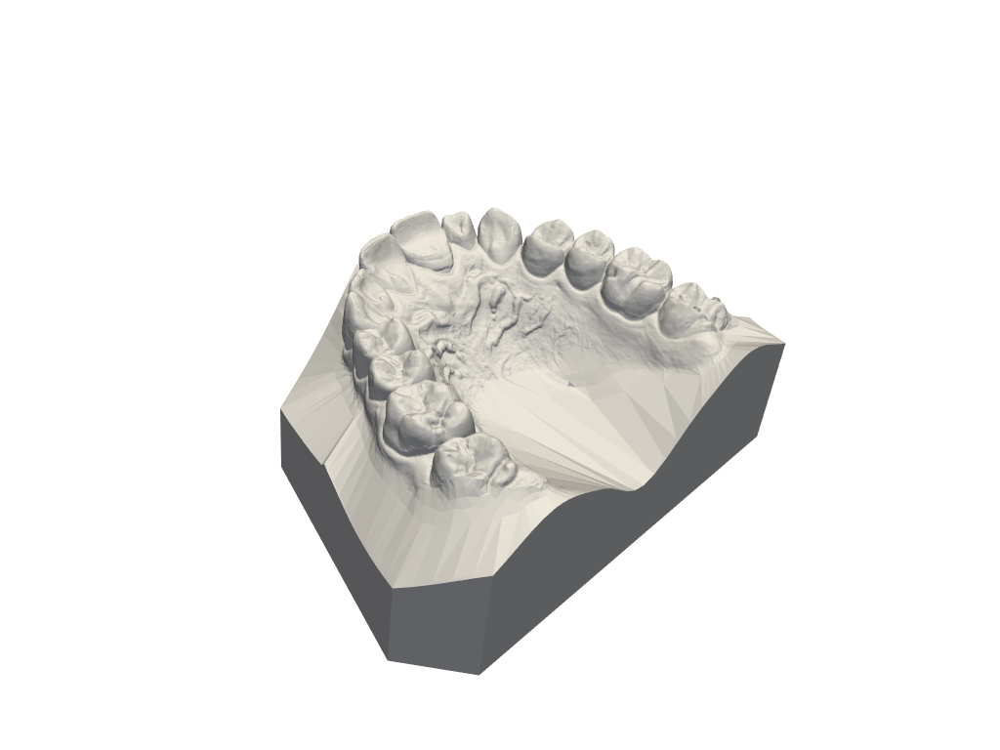

In [6]:
import numpy as np
import pyvista as pv
import json

# Patch deprecated np.bool alias
np.bool = bool

# Load STL file
mesh = pv.read(r"C:\Users\HP\Downloads\data_part_1\upper\M4HYU284\M4HYU284_upper.obj")

# Load prediction results
with open(r"C:\Users\HP\Downloads\working\classification_results.json", "r") as f:
    predictions = json.load(f)

# Define color map
prediction_colors = {
    'Calculus': [1.0, 0.0, 0.0],
    'Caries': [0.0, 1.0, 0.0],
    'Gingivitis': [0.0, 0.0, 1.0],
    'Ulcers': [1.0, 1.0, 0.0],
    'Tooth Discoloration': [0.5, 0.0, 0.5],
    'Hypodontia': [0.0, 1.0, 1.0]
}

# Initialize white color for all
colors = np.ones((mesh.n_points, 3))  # default to white

# Divide points among prediction regions
n_regions = len(predictions)
points_per_region = mesh.n_points // n_regions if n_regions > 0 else mesh.n_points

for i, (img_path, label) in enumerate(predictions.items()):
    # Handle empty labels
    if isinstance(label, list) and label:
        label = label[0]
    elif isinstance(label, str):
        pass  # already string
    else:
        label = None  # fallback if label is empty or invalid

    color = prediction_colors.get(label, [1.0, 1.0, 1.0])  # default to white

    start_idx = i * points_per_region
    end_idx = (i + 1) * points_per_region if i < n_regions - 1 else mesh.n_points
    colors[start_idx:end_idx] = color

# Assign color and plot
mesh.point_data['RegionColors'] = colors

plotter = pv.Plotter()
plotter.add_mesh(mesh, scalars='RegionColors', rgb=True)
plotter.show()


In [ ]:
import trimesh
import numpy as np
import json
import os

# Load STL
mesh = trimesh.load_mesh(r"C:\Users\HP\Downloads\mandible (1).glb")

# Load predictions
with open(r"C:\Users\HP\Downloads\working\classification_results.json", "r") as f:
    predictions = json.load(f)

# Define color mapping (RGB, scaled to 0-255)
prediction_colors = {
    'Calculus': [255, 0, 0],
    'Caries': [0, 255, 0],
    'Gingivitis': [0, 0, 255],
    'Ulcers': [255, 255, 0],
    'Tooth Discoloration': [128, 0, 128],
    'Hypodontia': [0, 255, 255]
}

""" Depending on how your mesh is divided (i.e., how the regions are mapped to vertices), you will see the following color-coded regions on the 3D model:

Red regions: Representing "Calculus"

Green regions: Representing "Caries"

Blue regions: Representing "Gingivitis"

Yellow regions: Representing "Ulcers"

Purple regions: Representing "Tooth Discoloration"

Cyan regions: Representing "Hypodontia" """

# Initialize all vertex colors to white
colors = np.ones((mesh.vertices.shape[0], 3), dtype=np.uint8) * 255

# Map predictions to mesh vertices
n_regions = len(predictions)
points_per_region = mesh.vertices.shape[0] // n_regions if n_regions > 0 else 1

for i, (img_path, label) in enumerate(predictions.items()):
    if isinstance(label, list) and label:
        label = label[0]
    elif not label:
        label = None

    color = prediction_colors.get(label, [255, 255, 255])  # white fallback
    start = i * points_per_region
    end = (i + 1) * points_per_region if i < n_regions - 1 else mesh.vertices.shape[0]
    colors[start:end] = color

# Assign vertex colors
mesh.visual.vertex_colors = colors

# Show mesh
#mesh.show()


In [1]:
import trimesh
import numpy as np
import json
import os

# Load STL
mesh = trimesh.load_mesh(r"C:\Users\HP\Desktop\project\lower jaw and uper jaw\296_LowerJawScan.stl")

# Load predictions
with open(r"C:\Users\HP\Downloads\working\classification_results.json", "r") as f:
    predictions = json.load(f)

# Define color mapping (RGB, scaled to 0-255)
prediction_colors = {
    'Calculus': [255, 0, 0],          # Red
    'Caries': [0, 255, 0],            # Green
    'Gingivitis': [0, 0, 255],        # Blue
    'Ulcers': [255, 255, 0],          # Yellow
    'Tooth Discoloration': [128, 0, 128], # Purple
    'Hypodontia': [0, 255, 255]       # Cyan
}

# Define the default color for "No Disease" (Yellow)
no_disease_color = [255, 255, 0]  # Yellow

""" 
Depending on how your mesh is divided (i.e., how the regions are mapped to vertices), 
you will see the following color-coded regions on the 3D model:

Red regions: Representing "Calculus"
Green regions: Representing "Caries"
Blue regions: Representing "Gingivitis"
Yellow regions: Representing "Ulcers"
Purple regions: Representing "Tooth Discoloration"
Cyan regions: Representing "Hypodontia"
"""

# Initialize all vertex colors to yellow (No Disease color)
colors = np.ones((mesh.vertices.shape[0], 3), dtype=np.uint8) * 255  # Default yellow

# Map predictions to mesh vertices
n_regions = len(predictions)
points_per_region = mesh.vertices.shape[0] // n_regions if n_regions > 0 else 1

for i, (img_path, label) in enumerate(predictions.items()):
    if isinstance(label, list) and label:
        label = label[0]
    elif not label:  # If no prediction, mark as 'No Disease'
        label = None

    # If label is not found in prediction colors, assign the 'No Disease' color (yellow)
    color = prediction_colors.get(label, no_disease_color)
    
    # Assign colors to the mesh vertices
    start = i * points_per_region
    end = (i + 1) * points_per_region if i < n_regions - 1 else mesh.vertices.shape[0]
    colors[start:end] = color

# Assign vertex colors to the mesh
mesh.visual.vertex_colors = colors

# Show mesh with the assigned colors
mesh.show()


Streamlit

In [2]:
import streamlit as st
import json
import trimesh
import plotly.graph_objects as go

# Load your JSON + mesh path
with open(r"c:\Users\HP\Downloads\working\classification_results.json") as f:
    metadata = json.load(f)

mesh = trimesh.load_mesh(r"C:\Users\HP\Downloads\data_part_1\upper\M4HYU284\M4HYU284_upper.obj")

st.title("🦷 Dental Digital Twin Viewer")

# Show Metadata
st.subheader("📄 Metadata")
st.json(metadata)

# Show 3D Model
st.subheader("🧊 3D Mesh Viewer")

vertices = mesh.vertices
faces = mesh.faces

fig = go.Figure(data=[
    go.Mesh3d(
        x=vertices[:, 0], y=vertices[:, 1], z=vertices[:, 2],
        i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
        color='lightblue', opacity=0.5
    )
])

fig.update_layout(scene=dict(aspectmode="data"))
st.plotly_chart(fig)


2025-05-17 11:37:43.292 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-17 11:37:43.817 
  command:

    streamlit run C:\Users\HP\AppData\Roaming\Python\Python38\site-packages\ipykernel_launcher.py [ARGUMENTS]
2025-05-17 11:37:43.818 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-17 11:37:43.818 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-17 11:37:43.819 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-17 11:37:43.819 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-17 11:37:43.820 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-05-17 11:37:43.820 Thread '

DeltaGenerator()